In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Importing the modules
import matplotlib as plt
import seaborn as sns
import sklearn
import tensorflow as tf
import keras
from keras import layers
import keras_cv
import keras_core as keras

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.23.5
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


Using TensorFlow backend


In [2]:
# Import TensorFlow into colab
import tensorflow as tf
import tensorflow_hub as hub
print("TF version: ", tf.__version__)
print("TF Hub version: ", hub.__version__)

# Check for GPU availability
print("GPU", "available (YESSSSSS!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available :()")

TF version:  2.12.0
TF Hub version:  0.12.0
GPU available (YESSSSSS!!!!!!!)


In [3]:
### Cleaning the dataset for corrupted format

import os
import csv

# Define supported formats
supported_formats = ['.jpg', '.jpeg', '.png', '.bmp', '.tiff', '.gif']

# Path to your dataset folder
dataset_folder = '/kaggle/input/driver-drowsiness/dataset_new'

# Output CSV file for labels
output_csv = 'image_labels.csv'

# Initialize a list to hold image paths and labels
image_data = []

# Loop through the dataset directory
for root, dirs, files in os.walk(dataset_folder):
    for file in files:
        # Get the file extension
        file_ext = os.path.splitext(file)[1].lower()
        
        # If the file is in supported formats, add it to the label list
        if file_ext in supported_formats:
            # Full image path
            file_path = os.path.join(root, file)
            # Extract the class label from the directory name (assuming each class is a folder)
            class_label = os.path.basename(root)
            # Append the image path and label to the list
            image_data.append([file_path, class_label])
        else:
            # Remove unsupported files
            file_path = os.path.join(root, file)
            print(f"Removing unsupported file: {file_path}")
            os.remove(file_path)

# Write the image paths and labels to the CSV file
with open(output_csv, mode='w', newline='') as csv_file:
    writer = csv.writer(csv_file)
    # Write header
    writer.writerow(['Image Path', 'Label'])
    # Write image data
    writer.writerows(image_data)

print(f"Label generation complete! Labels saved to {output_csv}")

Label generation complete! Labels saved to image_labels.csv


In [4]:
df = pd.read_csv("/kaggle/input/datasets/vatsalyakrish/image-csv/image_labels.csv")

import pandas as pd
import numpy as np

# 1. Load data
# full_df = pd.read_csv("your_data.csv") 

# --- PREPARE EYE DATA ---
# Filter for eye classes
eye_df = df[df['Label'].isin(['open', 'close'])].copy().reset_index(drop=True)

# Create Boolean labels directly: 'open' becomes True, 'close' becomes False
#y_eye = np.array(eye_df['label'] == 'open')

# --- PREPARE YAWN DATA ---
# Filter for yawn classes
yawn_df = df[df['Label'].isin(['yawn', 'no_yawn'])].copy().reset_index(drop=True)
yawn_df = yawn_df.reset_index(drop=True)

# Create Boolean labels directly: 'yawn' becomes True, 'no_yawn' becomes False
#y_yawn = np.array(yawn_df['label'] == 'yawn')

# To confirm it worked:
#print(f"Eye Labels (Sample): {y_eye[:5]}") # Output: [True False True...]


In [5]:
df.describe()

,Image Path,Label
count,114070,114070
unique,114070,4
top,/kaggle/input/driver-drowsiness/dataset_new/op...,open
freq,1,51581


<Axes: xlabel='Label'>

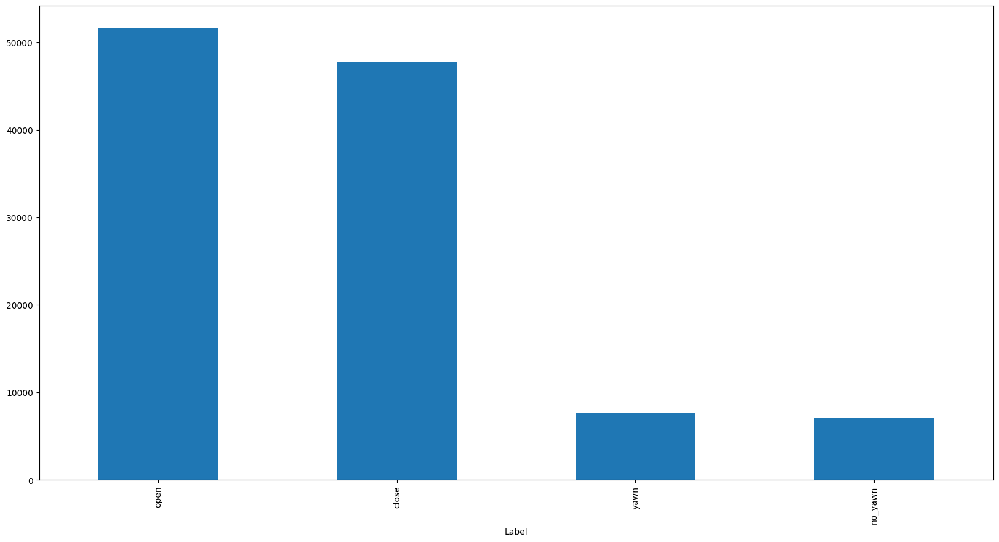

In [6]:
df["Label"].value_counts().plot.bar(figsize=(20, 10))

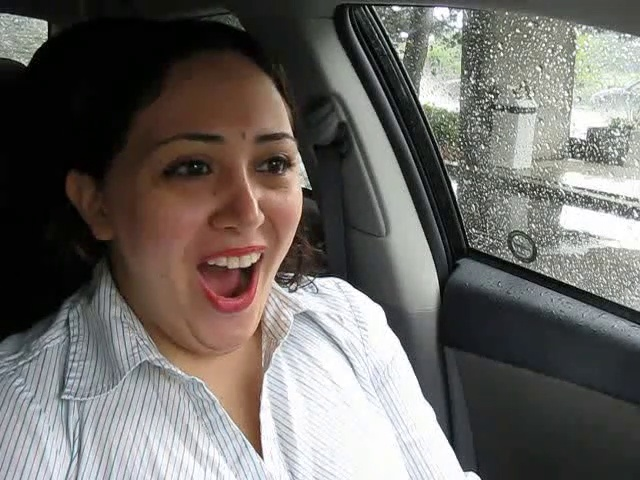

In [7]:
# Let's view  an image
from IPython.display import Image
Image("/kaggle/input/driver-drowsiness/dataset_new/yawn/100.jpg")

In [8]:
eye_df.head()

,Image Path,Label
0,/kaggle/input/driver-drowsiness/dataset_new/op...,open
1,/kaggle/input/driver-drowsiness/dataset_new/op...,open
2,/kaggle/input/driver-drowsiness/dataset_new/op...,open
3,/kaggle/input/driver-drowsiness/dataset_new/op...,open
4,/kaggle/input/driver-drowsiness/dataset_new/op...,open


In [9]:
yawn_df.head()

,Image Path,Label
0,/kaggle/input/driver-drowsiness/dataset_new/ya...,yawn
1,/kaggle/input/driver-drowsiness/dataset_new/ya...,yawn
2,/kaggle/input/driver-drowsiness/dataset_new/ya...,yawn
3,/kaggle/input/driver-drowsiness/dataset_new/ya...,yawn
4,/kaggle/input/driver-drowsiness/dataset_new/ya...,yawn


In [10]:
eye_df.describe()

,Image Path,Label
count,99312,99312
unique,99312,2
top,/kaggle/input/driver-drowsiness/dataset_new/op...,open
freq,1,51581


<Axes: xlabel='Label'>

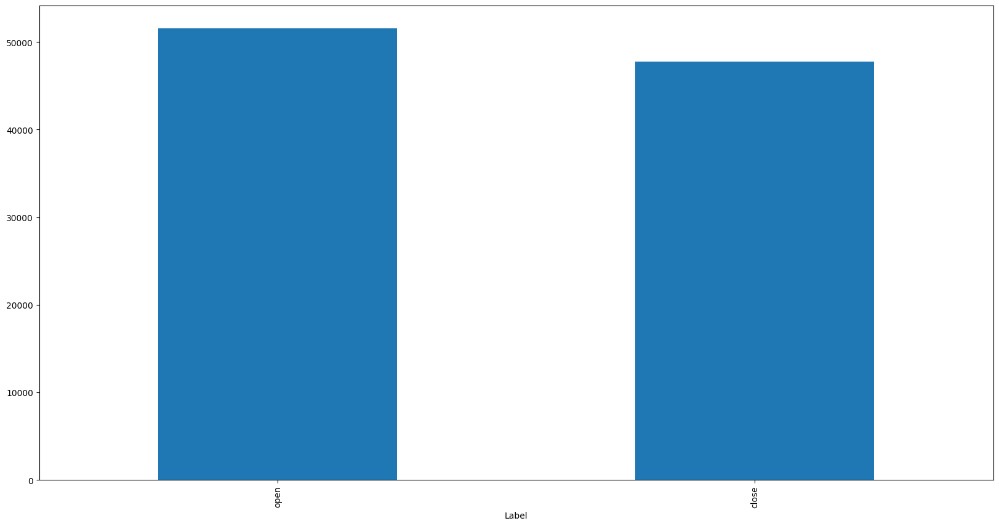

In [11]:
eye_df["Label"].value_counts().plot.bar(figsize=(20, 10))

In [12]:
yawn_df.describe()

,Image Path,Label
count,14758,14758
unique,14758,2
top,/kaggle/input/driver-drowsiness/dataset_new/ya...,yawn
freq,1,7662


<Axes: xlabel='Label'>

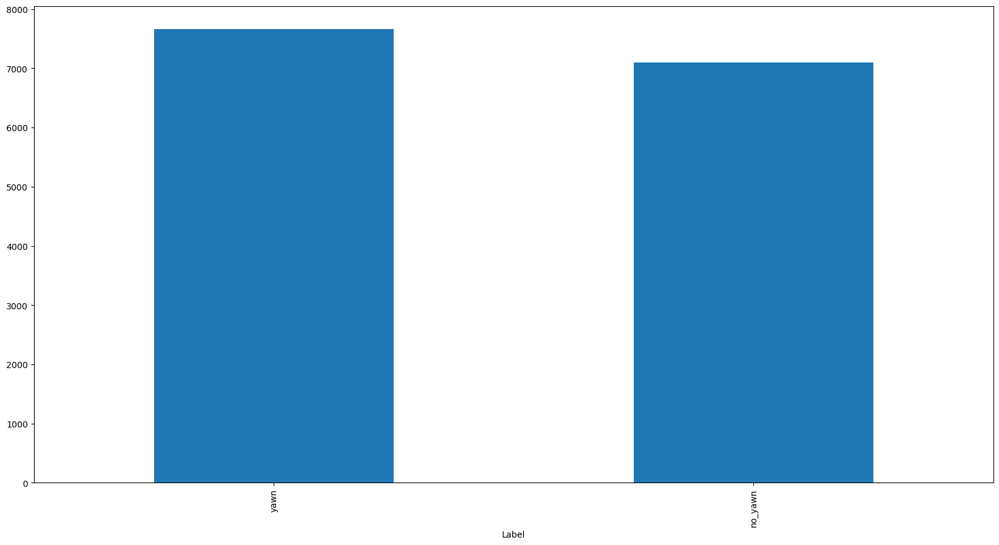

In [13]:
yawn_df["Label"].value_counts().plot.bar(figsize=(20, 10))

In [14]:
# Create path names from image ID's for model 1
filenames = eye_df["Image Path"]

# Check the first 10
filenames[:10]

0    /kaggle/input/driver-drowsiness/dataset_new/op...
1    /kaggle/input/driver-drowsiness/dataset_new/op...
2    /kaggle/input/driver-drowsiness/dataset_new/op...
3    /kaggle/input/driver-drowsiness/dataset_new/op...
4    /kaggle/input/driver-drowsiness/dataset_new/op...
5    /kaggle/input/driver-drowsiness/dataset_new/op...
6    /kaggle/input/driver-drowsiness/dataset_new/op...
7    /kaggle/input/driver-drowsiness/dataset_new/op...
8    /kaggle/input/driver-drowsiness/dataset_new/op...
9    /kaggle/input/driver-drowsiness/dataset_new/op...
Name: Image Path, dtype: object

In [15]:
len(filenames)

99312

In [16]:
# Create path names from image ID's for model 2
filename = yawn_df["Image Path"]

# Check the first 10
filename[:10]

0    /kaggle/input/driver-drowsiness/dataset_new/ya...
1    /kaggle/input/driver-drowsiness/dataset_new/ya...
2    /kaggle/input/driver-drowsiness/dataset_new/ya...
3    /kaggle/input/driver-drowsiness/dataset_new/ya...
4    /kaggle/input/driver-drowsiness/dataset_new/ya...
5    /kaggle/input/driver-drowsiness/dataset_new/ya...
6    /kaggle/input/driver-drowsiness/dataset_new/ya...
7    /kaggle/input/driver-drowsiness/dataset_new/ya...
8    /kaggle/input/driver-drowsiness/dataset_new/ya...
9    /kaggle/input/driver-drowsiness/dataset_new/ya...
Name: Image Path, dtype: object

In [17]:
len(filename)

14758

In [18]:
# Check whether number of filenames matches number of actual image files
import os
if len(df["Image Path"]) == len(filenames)+len(filename):
  print("Filenames match actual amount of files!!! Proceed.")
else:
  print("Filenames do not match actual amount of files, check the target directory.")

Filenames match actual amount of files!!! Proceed.


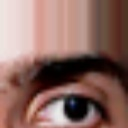

In [19]:
# One more check
Image(filenames[50000])

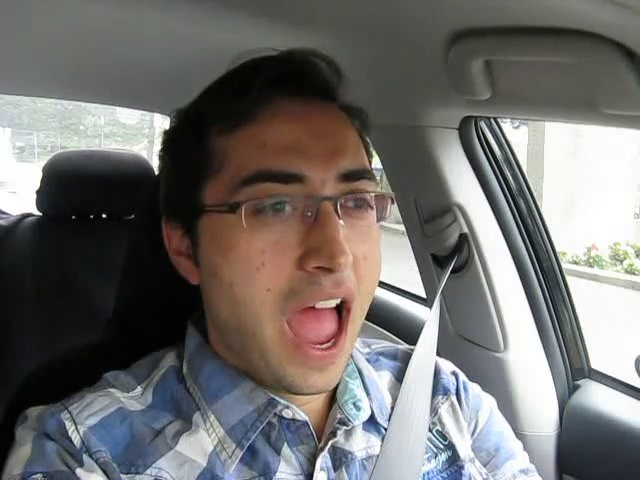

In [20]:
Image(filename[5000])

In [21]:
eye_df["Label"][50000]

'open'

In [22]:
yawn_df["Label"][5000]

'yawn'

In [23]:
import numpy as np
labels = eye_df["Label"].to_numpy()
# labels = np.array(labels) # does same thing as above
labels

array(['open', 'open', 'open', ..., 'close', 'close', 'close'],
      dtype=object)

In [24]:
len(labels)

99312

In [25]:
# For yawn data set
import numpy as np
label = yawn_df["Label"].to_numpy()
# labels = np.array(labels) # does same thing as above
label

array(['yawn', 'yawn', 'yawn', ..., 'no_yawn', 'no_yawn', 'no_yawn'],
      dtype=object)

In [26]:
len(label)

14758

In [27]:
# See if number of labels matches the number of filenames
if (len(labels) + len(label)) == len(filenames) + len(filename):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames")

Number of labels matches number of filenames!


In [28]:
# Find the unique label values
unique_labels1 = np.unique(labels)
len(unique_labels1)

2

In [29]:
unique_labels1 

array(['close', 'open'], dtype=object)

In [30]:
# Find the unique label values for yawning
unique_label2 = np.unique(label)
len(unique_label2)

2

In [31]:
unique_label2

array(['no_yawn', 'yawn'], dtype=object)

In [32]:
# Turn every label into a boolean array
boolean_labels1 = [label == unique_labels1 for label in labels]
boolean_labels1[:2] 

[array([False,  True]), array([False,  True])]

In [33]:
len(boolean_labels1)

99312

In [34]:
# Create the boolean arrays for your second set of labels
boolean_label2 = [label == unique_label2 for label in label]

# View the first two
boolean_label2[:2]

[array([False,  True]), array([False,  True])]

In [35]:
# Example turning boolean array into integers
print(labels[0]) # original labels
print(np.where(unique_labels1 == labels[0])) # index where label occurs
print(boolean_labels1[0].argmax()) # index where label occurs in boolean array
print(boolean_labels1[0].astype(int)) # there will be a 1 where the sample lable occurs

open
(array([1]),)
1
[0 1]


In [36]:
# Example turning boolean array into integers
print(label[0]) # original labels
print(np.where(unique_label2 == label[0])) # index where label occurs
print(boolean_label2[0].argmax()) # index where label occurs in boolean array
print(boolean_label2[0].astype(int)) # there will be a 1 where the sample lable occurs

yawn
(array([1]),)
1
[0 1]


In [37]:
print(labels[2])
print(boolean_labels1[2].astype(int))
print("-"*5)
print(label[2])
print(boolean_label2[2].astype(int))

open
[0 1]
-----
yawn
[0 1]


In [38]:
print(filenames[:5])
print("-"*50)
print(filename[:5])

0    /kaggle/input/driver-drowsiness/dataset_new/op...
1    /kaggle/input/driver-drowsiness/dataset_new/op...
2    /kaggle/input/driver-drowsiness/dataset_new/op...
3    /kaggle/input/driver-drowsiness/dataset_new/op...
4    /kaggle/input/driver-drowsiness/dataset_new/op...
Name: Image Path, dtype: object
--------------------------------------------------
0    /kaggle/input/driver-drowsiness/dataset_new/ya...
1    /kaggle/input/driver-drowsiness/dataset_new/ya...
2    /kaggle/input/driver-drowsiness/dataset_new/ya...
3    /kaggle/input/driver-drowsiness/dataset_new/ya...
4    /kaggle/input/driver-drowsiness/dataset_new/ya...
Name: Image Path, dtype: object


In [39]:
print(boolean_labels1[:2])
print("-"*50)
print(boolean_label2[:2])

[array([False,  True]), array([False,  True])]
--------------------------------------------------
[array([False,  True]), array([False,  True])]


## Creating Validation Sets

In [40]:
# --- TRACK 1: EYE DATA ---
X_eye = filenames
y_eye = boolean_labels1

# --- TRACK 2: YAWN DATA ---
X_yawn = filename
y_yawn = boolean_label2

In [41]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:100000}

In [42]:
# Use slicing [:NUM_IMAGES] to get the first 1000 items
# Split Eye Data
from sklearn.model_selection import train_test_split

x_train_eye, x_val_eye, y_train_eye, y_val_eye = train_test_split(
    X_eye[:NUM_IMAGES], 
    y_eye[:NUM_IMAGES], 
    test_size=0.2, 
    random_state=42
)

# Split Yawn Data
x_train_yawn, x_val_yawn, y_train_yawn, y_val_yawn = train_test_split(
    X_yawn[:NUM_IMAGES], 
    y_yawn[:NUM_IMAGES], 
    test_size=0.2, 
    random_state=42
)

In [43]:
len(x_train_eye), len(y_train_eye), len(x_val_eye), len(y_val_eye)

(800, 800, 200, 200)

In [44]:
len(x_train_yawn), len(y_train_yawn), len(x_val_yawn), len(y_val_yawn)

(800, 800, 200, 200)

In [45]:
# Let's have a geez at the trainig data
x_train_eye[:5], y_train_eye[:2]

(29     /kaggle/input/driver-drowsiness/dataset_new/op...
 535    /kaggle/input/driver-drowsiness/dataset_new/op...
 695    /kaggle/input/driver-drowsiness/dataset_new/op...
 557    /kaggle/input/driver-drowsiness/dataset_new/op...
 836    /kaggle/input/driver-drowsiness/dataset_new/op...
 Name: Image Path, dtype: object,
 [array([False,  True]), array([False,  True])])

## Preprocessing the images

In [46]:
# Let's have a geez at the trainig data
x_val_yawn[:5], y_val_yawn[:2]

(521    /kaggle/input/driver-drowsiness/dataset_new/ya...
 737    /kaggle/input/driver-drowsiness/dataset_new/ya...
 740    /kaggle/input/driver-drowsiness/dataset_new/ya...
 660    /kaggle/input/driver-drowsiness/dataset_new/ya...
 411    /kaggle/input/driver-drowsiness/dataset_new/ya...
 Name: Image Path, dtype: object,
 [array([False,  True]), array([False,  True])])

In [47]:
# Convert image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

from matplotlib.pyplot import imread
images = imread(filename[42])
images.shape

(480, 640, 3)

In [48]:
tf.constant(images)

<tf.Tensor: shape=(480, 640, 3), dtype=uint8, numpy=
array([[[ 76,  68,  45],
        [ 76,  68,  45],
        [ 76,  68,  45],
        ...,
        [116, 133,  99],
        [ 38,  55,  23],
        [ 27,  44,  12]],

       [[ 76,  68,  45],
        [ 76,  68,  45],
        [ 75,  67,  44],
        ...,
        [ 59,  76,  42],
        [ 60,  77,  45],
        [ 61,  78,  46]],

       [[ 76,  68,  45],
        [ 76,  68,  45],
        [ 75,  67,  44],
        ...,
        [ 38,  55,  23],
        [ 56,  72,  43],
        [ 52,  68,  39]],

       ...,

       [[110, 104, 104],
        [111, 105, 105],
        [112, 106, 106],
        ...,
        [ 92,  47,  18],
        [ 91,  46,  17],
        [ 91,  46,  17]],

       [[111, 105, 105],
        [111, 105, 105],
        [112, 106, 106],
        ...,
        [101,  54,  24],
        [101,  54,  24],
        [101,  54,  24]],

       [[111, 105, 105],
        [111, 105, 105],
        [112, 106, 106],
        ...,
        [107,  61,  2

In [49]:
tf.constant(image)

<tf.Tensor: shape=(128, 128, 3), dtype=uint8, numpy=
array([[[243, 229, 228],
        [243, 229, 228],
        [243, 229, 228],
        ...,
        [206, 149, 138],
        [206, 149, 138],
        [207, 150, 139]],

       [[243, 229, 228],
        [243, 229, 228],
        [243, 229, 228],
        ...,
        [207, 150, 139],
        [206, 149, 138],
        [207, 151, 138]],

       [[240, 229, 227],
        [240, 229, 227],
        [240, 229, 227],
        ...,
        [206, 153, 139],
        [205, 152, 138],
        [205, 152, 136]],

       ...,

       [[207, 138, 123],
        [207, 138, 123],
        [207, 138, 123],
        ...,
        [224, 162, 151],
        [226, 164, 153],
        [228, 166, 153]],

       [[207, 137, 125],
        [207, 137, 125],
        [207, 137, 125],
        ...,
        [226, 164, 151],
        [228, 166, 153],
        [229, 167, 152]],

       [[207, 137, 125],
        [207, 137, 125],
        [207, 137, 125],
        ...,
        [226, 164, 15

In [50]:
image.max(), image.min()

(243, 0)

In [51]:
images.max(), images.min()

(255, 0)

In [52]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """

  # Read in an image file
  image = tf.io.read_file(image_path)
  # turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float64)
  # Resize the image to our desired value (224,224)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])

  return image

## Turning the data into batches

In [53]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [54]:
# Demo of above
(process_image(X_eye[42]), tf.constant(y_eye[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.94509804, 0.9019608 , 0.89411765],
         [0.94509804, 0.9019608 , 0.89411765],
         [0.94509804, 0.9019608 , 0.89411765],
         ...,
         [0.7966387 , 0.58487403, 0.5378152 ],
         [0.80112046, 0.58935577, 0.54229695],
         [0.8039216 , 0.5921569 , 0.54509807]],
 
        [[0.94369745, 0.9005602 , 0.89271706],
         [0.94369745, 0.9005602 , 0.89271706],
         [0.94369745, 0.9005602 , 0.89271706],
         ...,
         [0.79783916, 0.58617455, 0.53891563],
         [0.8007203 , 0.58985597, 0.54099643],
         [0.802521  , 0.5921569 , 0.54229695]],
 
        [[0.94145656, 0.8983193 , 0.89047617],
         [0.94145656, 0.8983193 , 0.89047617],
         [0.94145656, 0.8983193 , 0.89047617],
         ...,
         [0.7997599 , 0.58825535, 0.5406763 ],
         [0.80008006, 0.59065634, 0.5389156 ],
         [0.8002801 , 0.5921569 , 0.53781515]],
 
        ...,
 
        [[0.8039216 , 0.5372549 

In [55]:
import tensorflow as tf

GLOBAL_BATCH_SIZE = 128

def create_data_batches(x, y=None, batch_size=GLOBAL_BATCH_SIZE, valid_data=False, test_data=False):
    """
    Creates batches for any dataset (Eye or Yawn).
    Includes Autotune Prefetching for GPU optimization.
    """
    # Use AUTOTUNE to let TensorFlow optimize CPU/GPU parallelization
    AUTOTUNE = tf.data.AUTOTUNE

    if test_data:
        print("Creating test data batches....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x)))
        # Map the preprocessing and prefetch
        data_batch = data.map(process_image, num_parallel_calls=AUTOTUNE).batch(batch_size).prefetch(AUTOTUNE)
        return data_batch

    elif valid_data:
        print("Creating validation data batches.....")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        # Validation doesn't need shuffle, but needs prefetch
        data_batch = data.map(get_image_label, num_parallel_calls=AUTOTUNE).batch(batch_size).prefetch(AUTOTUNE)
        return data_batch

    else:
        print("Creating training data batches......")
        data = tf.data.Dataset.from_tensor_slices((tf.constant(x), tf.constant(y)))
        
        # Shuffle filepaths (faster than shuffling actual images)
        data = data.shuffle(buffer_size=len(x))
        
        # Map and prefetch for maximum performance
        data_batch = data.map(get_image_label, num_parallel_calls=AUTOTUNE).batch(batch_size).prefetch(AUTOTUNE)
        return data_batch

In [56]:
# --- 1. EYE DATA BATCHES ---
# Using the 95k Eye dataset
print("Setting up Eye Expert Batches...")
train_eye_data = create_data_batches(x_train_eye, y_train_eye)
val_eye_data = create_data_batches(x_val_eye, y_val_eye, valid_data=True)

# --- 2. YAWN DATA BATCHES ---
# Using the 14k Yawn dataset
print("\nSetting up Yawn Expert Batches...")
train_yawn_data = create_data_batches(x_train_yawn, y_train_yawn)
val_yawn_data = create_data_batches(x_val_yawn, y_val_yawn, valid_data=True)

Setting up Eye Expert Batches...
Creating training data batches......
Creating validation data batches.....

Setting up Yawn Expert Batches...
Creating training data batches......
Creating validation data batches.....


In [57]:
# Check Eye Data
print("Eye Data Spec:", train_eye_data.element_spec)

print("-"*50)

# Check Yawn Data
print("Yawn Data Spec:", train_yawn_data.element_spec)

Eye Data Spec: (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))
--------------------------------------------------
Yawn Data Spec: (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 2), dtype=tf.bool, name=None))


## Visualization our data batches

In [58]:
import matplotlib.pyplot as plt

def show_25_images(images, labels, classes):
    """
    Displays a plot of 25 images and their labels from a data batch.
    Accepts 'classes' to handle different label sets (Eye vs Yawn).
    """
    # Setup the figure 
    plt.figure(figsize=(10, 10))
    
    # Loop through 25 (or fewer if the batch is smaller)
    for i in range(min(len(images), 25)):
        # Create subplots (5 rows, 5 columns)
        ax = plt.subplot(5, 5, i+1)
        
        # Display an image
        plt.imshow(images[i])
        
        # Use the specific 'classes' list passed to the function
        # argmax() finds the index of the 'True' value in your boolean array
        class_name = classes[labels[i].argmax()]
        
        plt.title(class_name)
        
        # Cleaner look: remove axes
        plt.axis("off")
    
    plt.tight_layout() # Prevents titles from overlapping

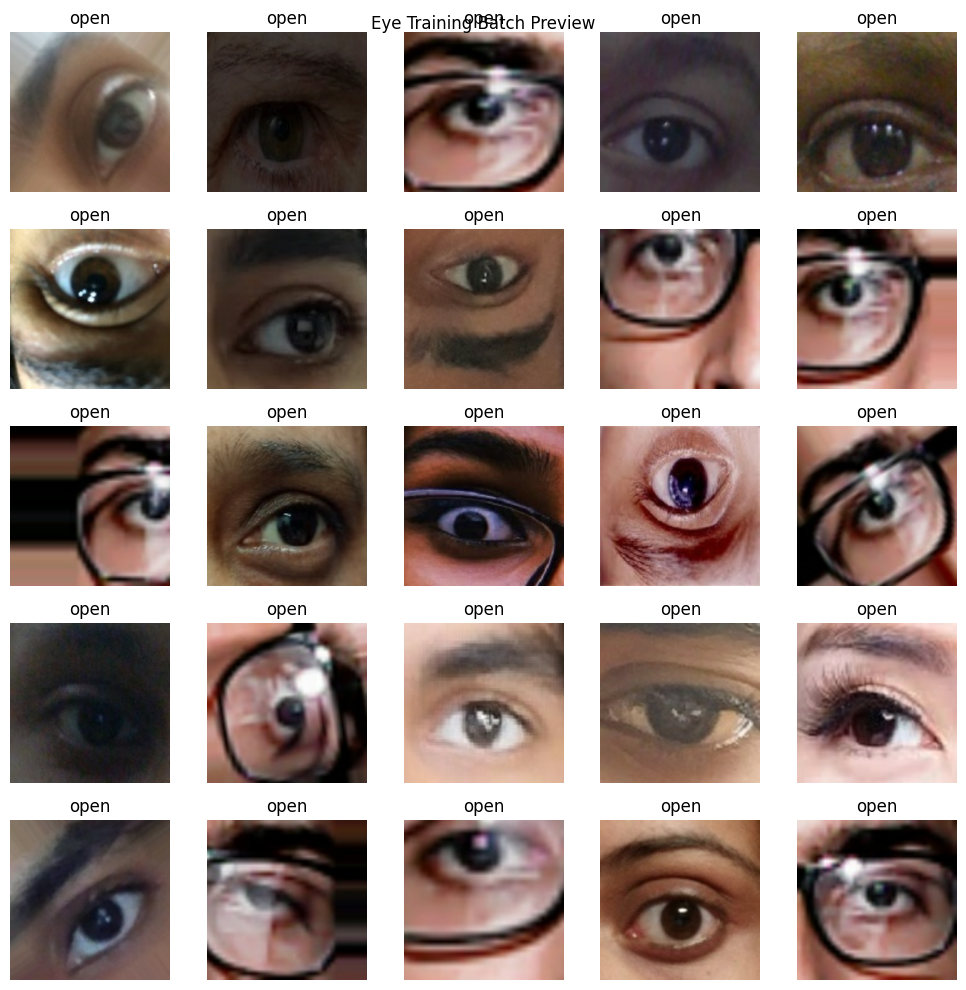

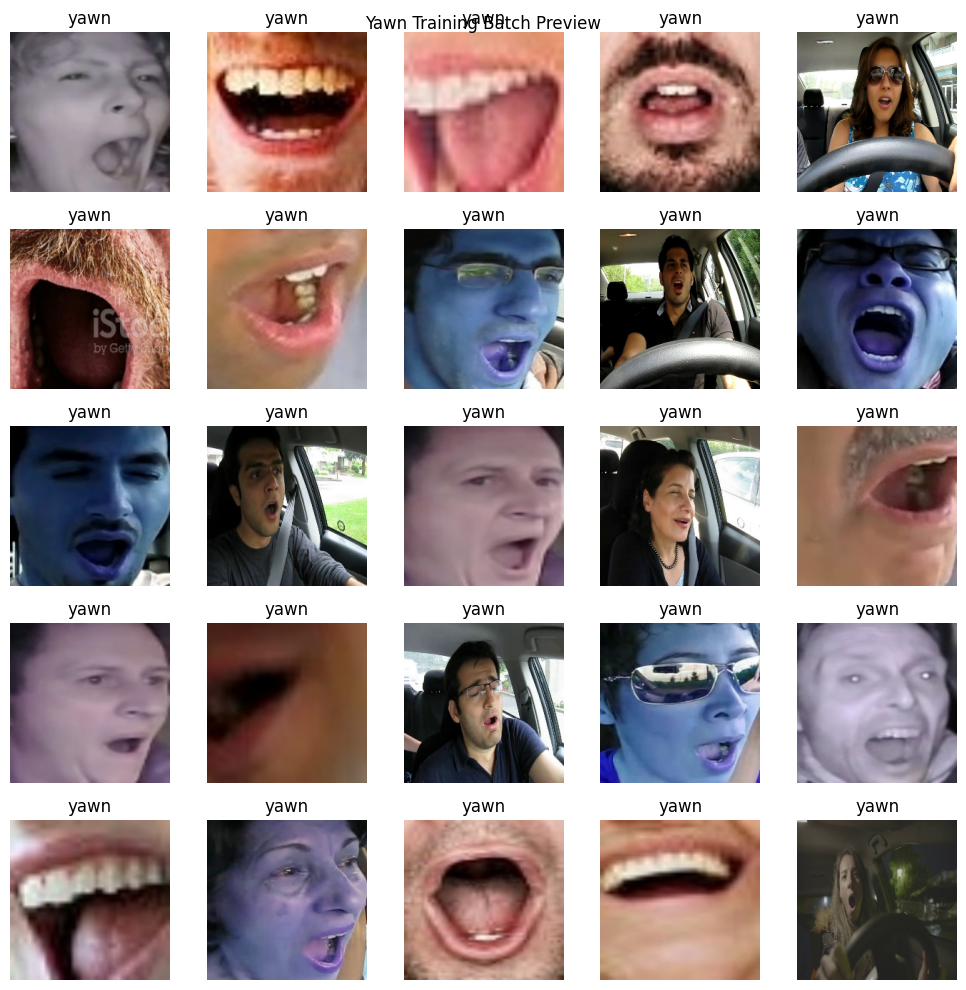

In [59]:
import matplotlib.pyplot as plt

# Visualize Eye Training Batch
eye_images, eye_labels = next(train_eye_data.as_numpy_iterator())
show_25_images(eye_images, eye_labels, unique_labels1) # eye_unique = ['closeEye', 'openEye']
plt.suptitle("Eye Training Batch Preview")
plt.show()

# Visualize Yawn Training Batch
yawn_images, yawn_labels = next(train_yawn_data.as_numpy_iterator())
show_25_images(yawn_images, yawn_labels, unique_label2) # yawn_unique = ['no_yawn', 'yawn']
plt.suptitle("Yawn Training Batch Preview")
plt.show()

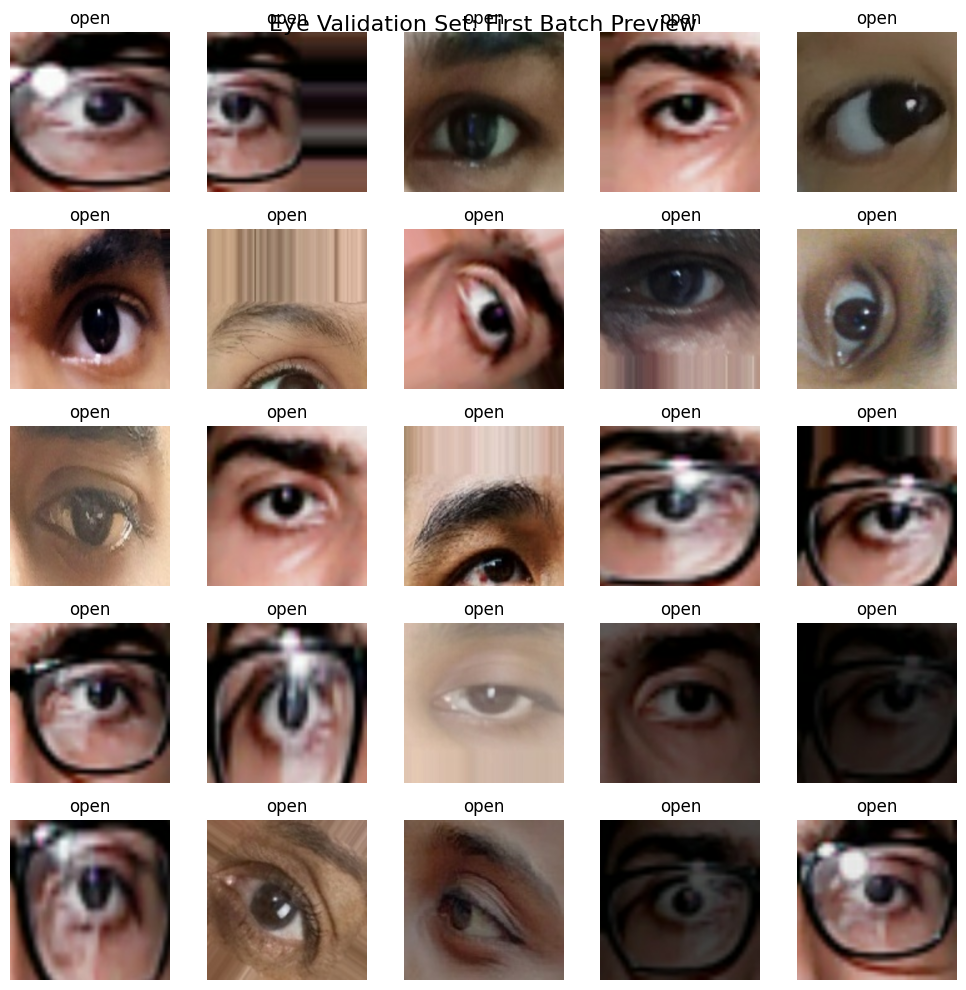

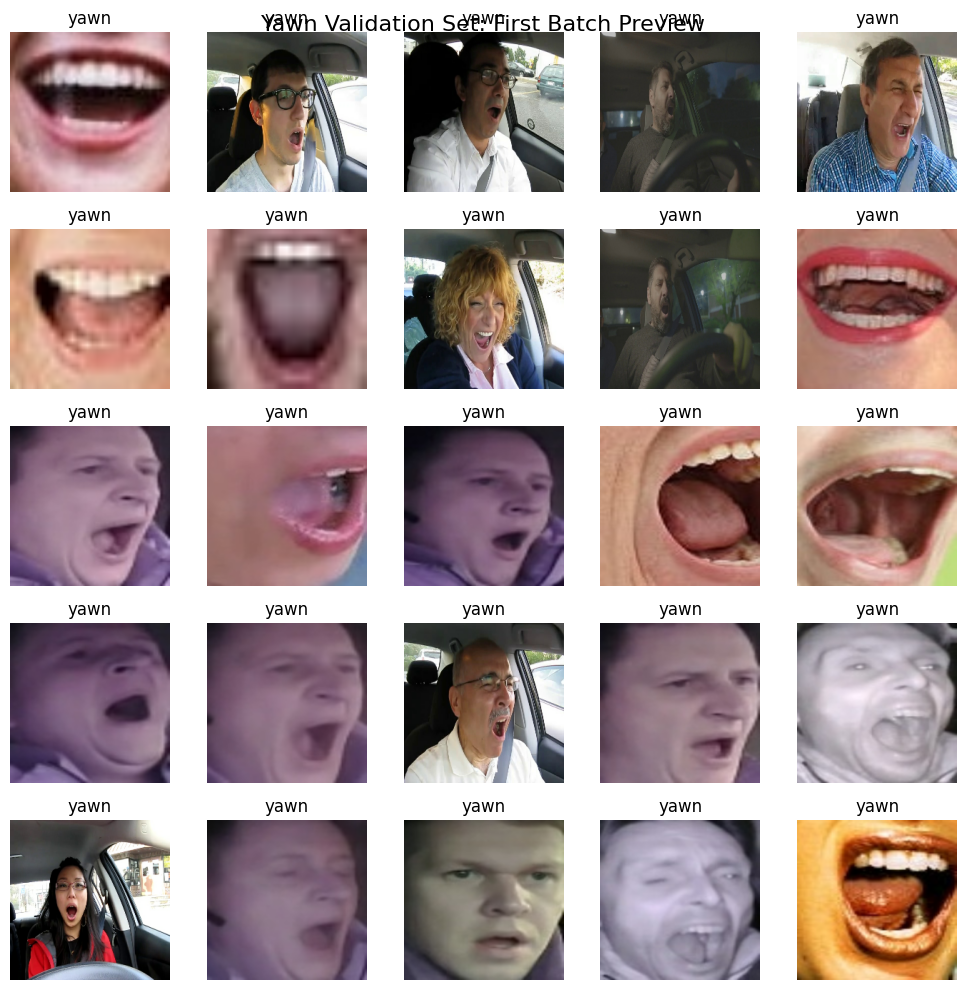

In [60]:
import matplotlib.pyplot as plt

# --- 1. Visualize Eye Validation Batch ---
# Pull one batch (64 images) from the eye validation stream
val_eye_images, val_eye_labels = next(val_eye_data.as_numpy_iterator())

show_25_images(val_eye_images, val_eye_labels, unique_labels1)
plt.suptitle("Eye Validation Set: First Batch Preview", fontsize=16)
plt.show()

# --- 2. Visualize Yawn Validation Batch ---
# Pull one batch (64 images) from the yawn validation stream
val_yawn_images, val_yawn_labels = next(val_yawn_data.as_numpy_iterator())

show_25_images(val_yawn_images, val_yawn_labels, unique_label2)
plt.suptitle("Yawn Validation Set: First Batch Preview", fontsize=16)
plt.show()

In [61]:
# --- HELPER: CONVERT BOOLEAN ARRAY TO BINARY SCALAR ---
# Your y_train looks like [array([True, False]), ...] 
# We need it to be [0, ...] for binary_crossentropy
# Updated for Dual T4 GPUs
GLOBAL_BATCH_SIZE = 128

def simplify_labels(y_boolean):
    return np.array([label.argmax() for label in y_boolean])
# --- 1. Simplify Eye Labels ---
y_train_eye_fixed = simplify_labels(y_train_eye)
y_val_eye_fixed = simplify_labels(y_val_eye)

# --- 2. Simplify Yawn Labels ---
y_train_yawn_fixed = simplify_labels(y_train_yawn)
y_val_yawn_fixed = simplify_labels(y_val_yawn)

# --- 3. RE-CREATE THE BATCHES ---
# This is the critical step! You must re-run create_data_batches with the new fixed labels
#train_eye_data = create_data_batches(x_train_eye, y_train_eye_fixed)
#val_eye_data = create_data_batches(x_val_eye, y_val_eye_fixed, valid_data=True)

#train_yawn_data = create_data_batches(x_train_yawn, y_train_yawn_fixed)
#val_yawn_data = create_data_batches(x_val_yawn, y_val_yawn_fixed, valid_data=True)

In [62]:
train_eye_data = create_data_batches(x_train_eye, y_train_eye_fixed, batch_size=GLOBAL_BATCH_SIZE)
val_eye_data = create_data_batches(x_val_eye, y_val_eye_fixed, valid_data=True, batch_size=GLOBAL_BATCH_SIZE)

train_yawn_data = create_data_batches(x_train_yawn, y_train_yawn_fixed, batch_size=GLOBAL_BATCH_SIZE)
val_yawn_data = create_data_batches(x_val_yawn, y_val_yawn_fixed, valid_data=True, batch_size=GLOBAL_BATCH_SIZE)

Creating training data batches......
Creating validation data batches.....
Creating training data batches......
Creating validation data batches.....


## Building a model

In [63]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]   # batch, height, width, colur channels

# Setup output shape of our model
#OUTPUT_SHAPE = len(unique_labels)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

In [64]:
import tensorflow as tf
from tensorflow.keras import layers, models, regularizers

# 1. Initialize the strategy
strategy = tf.distribute.MirroredStrategy()
print(f"Number of devices: {strategy.num_replicas_in_sync}")

# --- PENALIZED DUAL MODEL BUILDER ---
def build_expert_model():
    base_model = tf.keras.applications.MobileNetV2(
        input_shape=(224, 224, 3),
        include_top=False,
        weights='imagenet'
    )
    # Keep the feature extractor frozen initially
    base_model.trainable = False 

    model = models.Sequential([
        base_model,
        layers.GlobalAveragePooling2D(),
        
        # PENALTY 1: L2 Regularization (Weight Decay)
        # 0.01 is a strong penalty to keep weights small and simple
        layers.Dense(128, activation='relu', 
                     kernel_regularizer=regularizers.l2(0.01)),
        
        # PENALTY 2: High Dropout
        layers.Dropout(0.5),
        
        layers.Dense(1, activation='sigmoid') 
    ])

    model.compile(
        optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
        
        # PENALTY 3: Label Smoothing
        # Tells the model "Don't be 100% sure; 0.9 is enough."
        loss=tf.keras.losses.BinaryCrossentropy(label_smoothing=0.1),
        
        metrics=['accuracy']
    )
    return model

# 3. Create the models INSIDE the scope
with strategy.scope():
    eye_model = build_expert_model()
    yawn_model = build_expert_model()

Number of devices: 2
9406464/9406464 [==============================] - 0s 0us/step


In [65]:
eye_model.summary()
print("-"*80)
yawn_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenetv2_1.00_224 (Funct  (None, 7, 7, 1280)       2257984   
 ional)                                                          
                                                                 
 global_average_pooling2d (G  (None, 1280)             0         
 lobalAveragePooling2D)                                          
                                                                 
 dense (Dense)               (None, 128)               163968    
                                                                 
 dropout (Dropout)           (None, 128)               0         
                                                                 
 dense_1 (Dense)             (None, 1)                 129       
                                                                 
Total params: 2,422,081
Trainable params: 164,097
Non-tr

# Creating Callbacks

In [66]:
# Load TendoBoard notebook extension
%load_ext tensorboard

In [67]:
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",      # 🔥 CHANGE THIS
    patience=3,
    min_delta=1e-3,          # 🔥 INCREASE THIS
    restore_best_weights=True,
    verbose=1
)

In [68]:
import os
import datetime
import tensorflow as tf

def create_callbacks(model_name):
    """
    Creates a set of callbacks (TensorBoard, EarlyStopping, ModelCheckpoint)
    specific to the model track being trained.
    """
    # 1. Setup TensorBoard log directory with timestamp
    base_log_dir = "logs/fit/"
    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
    log_dir = os.path.join(base_log_dir, model_name, timestamp)
    
    tensorboard_callback = tf.keras.callbacks.TensorBoard(
        log_dir=log_dir, 
        histogram_freq=1
    )

    # 2. Early Stopping (prevents overfitting and saves time)
    early_stopping = tf.keras.callbacks.EarlyStopping(
        monitor="val_loss",      # 🔥 CHANGE THIS
        patience=3,
        min_delta=1e-3,          # 🔥 INCREASE THIS
        restore_best_weights=True,
        verbose=1
    )

    # 3. Model Checkpoint (saves the best version of the model automatically)
    checkpoint_path = f"models/checkpoints/{model_name}_best.h5"
    os.makedirs("models/checkpoints", exist_ok=True)
    checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(
        filepath=checkpoint_path,
        save_best_only=True,
        monitor='val_loss'
    )

    return [tensorboard_callback, early_stopping, checkpoint_callback]

# --- Usage in Training ---

# Callbacks for Eye Model
eye_callbacks = create_callbacks("eye_expert")

# Callbacks for Yawn Model
yawn_callbacks = create_callbacks("yawn_expert")

## Early stopping callbacks

In [69]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor="val_loss",           # Recommended: val_loss is more sensitive than accuracy
    patience=3,                   # Stops if no improvement after 3 epochs
    min_delta=1e-3,
    restore_best_weights=True,    # CRITICAL: Reverts model to the best state found
    verbose=1                     # Prints a message when it stops training
)

## Training on Subset data

In [70]:
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10} 

In [71]:
# Check to make sure we're still running on a GPU
print("GPU", "available (YESSS!!!!!!!!!)" if tf.config.list_physical_devices("GPU") else "not available")

GPU available (YESSS!!!!!!!!!)


In [72]:
def train_expert_model(model_name, train_data, val_data, epochs=10):
    """
    Trains a specialized model (Eye or Yawn) using specific data streams.
    Returns the trained model and its history.
    """
    print(f"\n--- Initializing Training for: {model_name} ---")
    
    # 1. Create a fresh model instance
    # Assuming OUTPUT_SHAPE=1 for your binary sigmoid models
    model = build_expert_model() 

    # 2. Create specific callbacks for this model track
    # This ensures logs are separated in TensorBoard
    tensorboard = create_callbacks(model_name)
    
    # 3. Fit the model
    history = model.fit(
        x=train_data,
        epochs=NUM_EPOCHS,
        validation_data=val_data,
        validation_freq=1,
        steps_per_epoch=20,        # 👈 limits training
        validation_steps=5,
        # Re-using your early_stopping callback
        callbacks=[tensorboard, early_stopping]
    )

    print(f"--- Training Complete for {model_name} ---")
    return model, history

In [73]:
# --- 1. Train the Eye Expert ---
# We pass the name, the eye training batches, and the eye validation batches
eye_model, eye_history = train_expert_model(
    model_name="eye_expert", 
    train_data=train_eye_data,  # Use your eye-specific batch variable
    val_data=val_eye_data,      # Use your eye-specific validation variable
    epochs=10
)

# --- 2. Train the Yawn Expert ---
# After the eye model finishes, we run this one
yawn_model, yawn_history = train_expert_model(
    model_name="yawn_expert",
    train_data=train_yawn_data, # Use your yawn-specific batch variable
    val_data=val_yawn_data,     # Use your yawn-specific validation variable
    epochs=12
)


--- Initializing Training for: eye_expert ---
Epoch 1/100
20/20 [==============================] - 13s 314ms/step - loss: 2.6688 - accuracy: 0.9100 - val_loss: 2.5162 - val_accuracy: 1.0000
--- Training Complete for eye_expert ---

--- Initializing Training for: yawn_expert ---
Epoch 1/100
20/20 [==============================] - 8s 230ms/step - loss: 2.8026 - accuracy: 0.8250 - val_loss: 2.5264 - val_accuracy: 1.0000
--- Training Complete for yawn_expert ---


In [74]:
# Checking tensorboard logs
%tensorboard --logdir log

## Marking and Evaluation of predictions using trained model

In [75]:
# 1. Make predictions on Eye validation data
eye_predictions = eye_model.predict(val_eye_data, verbose=1)

# 2. Convert probabilities to binary integers (0 or 1)
# 0 = first class (e.g., 'closeEye'), 1 = second class (e.g., 'openEye')
threshold = 0.5
eye_predicted_labels = (eye_predictions > threshold).astype(int)

# --- Check a specific prediction (index 42) ---
index = 42
# For binary, predicted_labels[index] is a single-element array like [1]
pred_value = eye_predicted_labels[index][0] 
prob_value = eye_predictions[index][0]

print(f"Prediction for Eye index {index}:")
print(f"Raw Probability: {prob_value:.4f}")
print(f"Binary Label: {pred_value}")
# unique_labels1 = ['closeEye', 'openEye']
print(f"Predicted Class: {unique_labels1[pred_value]}")

2/2 [==============================] - 1s 152ms/step
Prediction for Eye index 42:
Raw Probability: 0.9906
Binary Label: 1
Predicted Class: open


In [76]:
# 1. Make predictions on Yawn validation data
yawn_predictions = yawn_model.predict(val_yawn_data, verbose=1)

# 2. Convert to binary labels
yawn_predicted_labels = (yawn_predictions > threshold).astype(int)

# --- Check a specific prediction (index 42) ---
index = 42
pred_value_yawn = yawn_predicted_labels[index][0]
prob_value_yawn = yawn_predictions[index][0]

print(f"\nPrediction for Yawn index {index}:")
print(f"Raw Probability: {prob_value_yawn:.4f}")
print(f"Binary Label: {pred_value_yawn}")
# unique_label2 = ['no_yawn', 'yawn']
print(f"Predicted Class: {unique_label2[pred_value_yawn]}")

2/2 [==============================] - 1s 152ms/step

Prediction for Yawn index 42:
Raw Probability: 0.9349
Binary Label: 1
Predicted Class: yawn


In [77]:
def get_pred_label(prediction_probability, labels_list):
    """
    Turns a single binary prediction probability into a label string.
    """
    # If probability is > 0.5, it's the class at index 1, otherwise index 0
    if prediction_probability > 0.5:
        return labels_list[1]
    else:
        return labels_list[0]

In [78]:
def unbatchify(data, labels_list):
    """
    Takes a batched dataset and returns separate arrays of images 
    and their corresponding text labels.
    """
    images = []
    labels = []
    
    # Loop through unbatched data
    # In binary, 'label' is a single integer (0 or 1)
    for image, label in data.unbatch().as_numpy_iterator():
        images.append(image)
        # We use the label (0 or 1) directly as the index
        labels.append(labels_list[int(label)]) 
        
    return images, labels

In [79]:
# Unbatchify the Eye validation data
val_eye_images, val_eye_labels = unbatchify(val_eye_data, unique_labels1)

# Check the first item
print(f"Eye Image Shape: {val_eye_images[0].shape}")
print(f"Eye Label: {val_eye_labels[0]}")

Eye Image Shape: (224, 224, 3)
Eye Label: open


In [80]:
# Unbatchify the Yawn validation data
val_yawn_images, val_yawn_labels = unbatchify(val_yawn_data, unique_label2)

# Check the first item
print(f"Yawn Image Shape: {val_yawn_images[0].shape}")
print(f"Yawn Label: {val_yawn_labels[0]}")

Yawn Image Shape: (224, 224, 3)
Yawn Label: yawn


In [81]:
# To get raw images and numerical labels for Yawning
yawn_images_raw = []
yawn_labels_raw = []

for image, label in val_yawn_data.unbatch().as_numpy_iterator():
    yawn_images_raw.append(image)
    yawn_labels_raw.append(label)

# Check the first numerical label (will be 0.0 or 1.0)
print(f"Numerical Label: {yawn_labels_raw[0]}")

Numerical Label: 1


In [82]:
import numpy as np
import matplotlib.pyplot as plt

def plot_preds(prediction_probabilities, labels, images, labels_list, n=1):
    """
    View the predictions, ground truth, and image for sample n.
    Adjusted for binary classification confidence.
    """
    # 1. Extract the specific data point
    # We use [0] because prediction_probabilities[n] is an array like [0.89]
    pred_prob = prediction_probabilities[n][0]
    true_label = labels[n]
    image = images[n]

    # 2. Get the predicted label string
    pred_label = get_pred_label(pred_prob, labels_list)

    # 3. Calculate Binary Confidence
    # If prob is 0.9, confidence is 90%. If prob is 0.1, confidence is 100-10 = 90%.
    confidence = pred_prob if pred_prob > 0.5 else 1 - pred_prob

    # 4. Plot image
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # 5. Determine color (Green for Correct, Red for Incorrect)
    color = "green" if pred_label == true_label else "red"
        
    # 6. Set Title
    plt.title(f"Pred: {pred_label} | Conf: {confidence*100:2.0f}% | Real: {true_label}", 
              color=color)

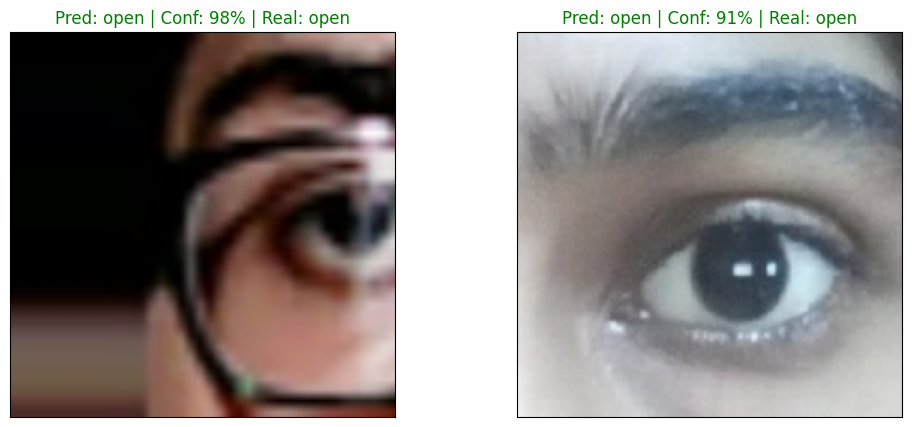

In [83]:
# Eye labels: ['closeEye', 'openEye']
plt.figure(figsize=(12, 5))

# Plot a specific index
plt.subplot(1, 2, 1)
plot_preds(prediction_probabilities=eye_predictions,
           labels=val_eye_labels,
           images=val_eye_images,
           labels_list=unique_labels1,
           n=77)

plt.subplot(1, 2, 2)
plot_preds(prediction_probabilities=eye_predictions,
           labels=val_eye_labels,
           images=val_eye_images,
           labels_list=unique_labels1,
           n=144)

plt.show()

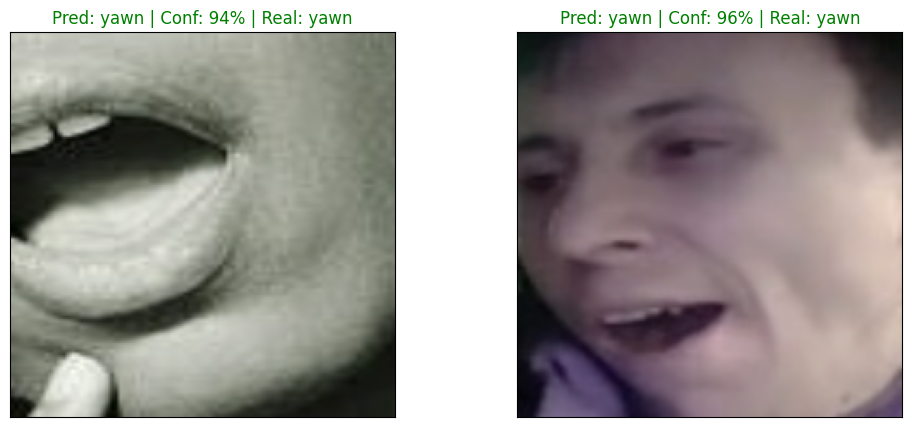

In [84]:
# Yawn labels: ['no_yawn', 'yawn']
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plot_preds(prediction_probabilities=yawn_predictions,
           labels=val_yawn_labels,
           images=val_yawn_images,
           labels_list=unique_label2,
           n=81)

plt.subplot(1, 2, 2)
plot_preds(prediction_probabilities=yawn_predictions,
           labels=val_yawn_labels,
           images=val_yawn_images,
           labels_list=unique_label2,
           n=120)

plt.show()

In [85]:
def plot_pred_conf(prediction_probabilities, labels, labels_list, n=1):
    """
    Plots the confidence for both binary outcomes and highlights the truth label.
    """
    # 1. Get scalar probability for the positive class (index 1)
    # pred_prob is a value between 0 and 1
    positive_prob = prediction_probabilities[n][0] 
    negative_prob = 1 - positive_prob # The probability of class at index 0
    
    true_label = labels[n]
    
    # 2. Organize data for plotting [Index 0, Index 1]
    plot_values = [negative_prob, positive_prob]
    plot_labels = labels_list
    
    # 3. Setup the bar plot
    plt.figure(figsize=(8, 5))
    top_plot = plt.bar(np.arange(len(plot_labels)), 
                       plot_values, 
                       color="grey")
    
    plt.xticks(np.arange(len(plot_labels)), 
               labels=plot_labels)
    plt.ylim(0, 1) # Probability is always between 0 and 1
    plt.ylabel("Confidence (0.0 - 1.0)")

    # 4. Highlight the "True Label" bar
    # Find which index in our plot matches the ground truth
    for i, label in enumerate(plot_labels):
        if label == true_label:
            top_plot[i].set_color("green")
            
    # Add predicted label as title for clarity
    pred_label = get_pred_label(positive_prob, labels_list)
    plt.title(f"Sample #{n} | Predicted: {pred_label} (True: {true_label})")

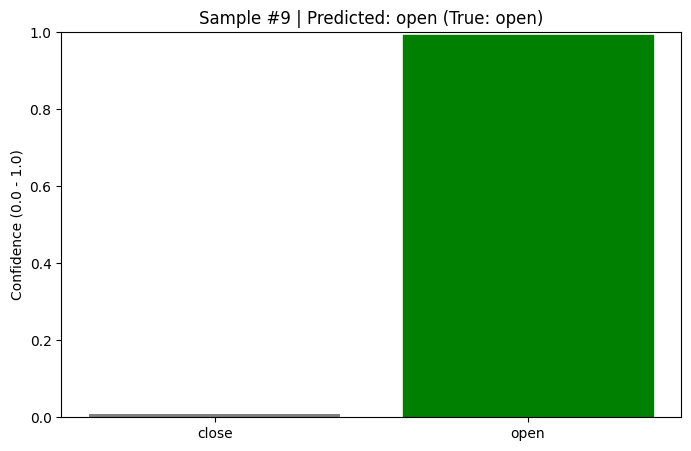

In [86]:
# Eye labels: ['closeEye', 'openEye']
plot_pred_conf(prediction_probabilities=eye_predictions,
               labels=val_eye_labels,
               labels_list=unique_labels1,
               n=9)
plt.show()

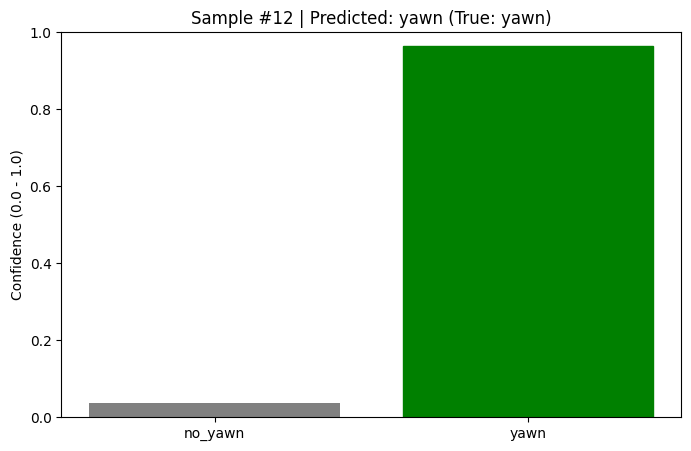

In [87]:
# Yawn labels: ['no_yawn', 'yawn']
plot_pred_conf(prediction_probabilities=yawn_predictions,
               labels=val_yawn_labels,
               labels_list=unique_label2,
               n=12) # Testing a different index
plt.show()

In [88]:
def plot_pred(prediction_probabilities, labels, images, labels_list, n=1):
    """
    View the predictions, ground truth and image for sample n.
    Adjusted for Binary Sigmoid outputs.
    """
    # Get scalar probability, true string label, and image
    pred_prob = prediction_probabilities[n][0]
    truth_label = labels[n]
    image = images[n]

    # Get the pred label string using our previous helper
    pred_label = get_pred_label(pred_prob, labels_list)

    # Calculate Binary Confidence (distance from the 0.5 threshold)
    confidence = pred_prob if pred_prob > 0.5 else 1 - pred_prob

    # Plot image & remove ticks
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])

    # Color logic: Green for correct, Red for wrong
    color = "green" if pred_label == truth_label else "red"

    # Title: Predicted Label, Confidence %, and Truth Label
    plt.title(f"{pred_label} {confidence*100:2.0f}% ({truth_label})", 
              color=color, fontsize=10)

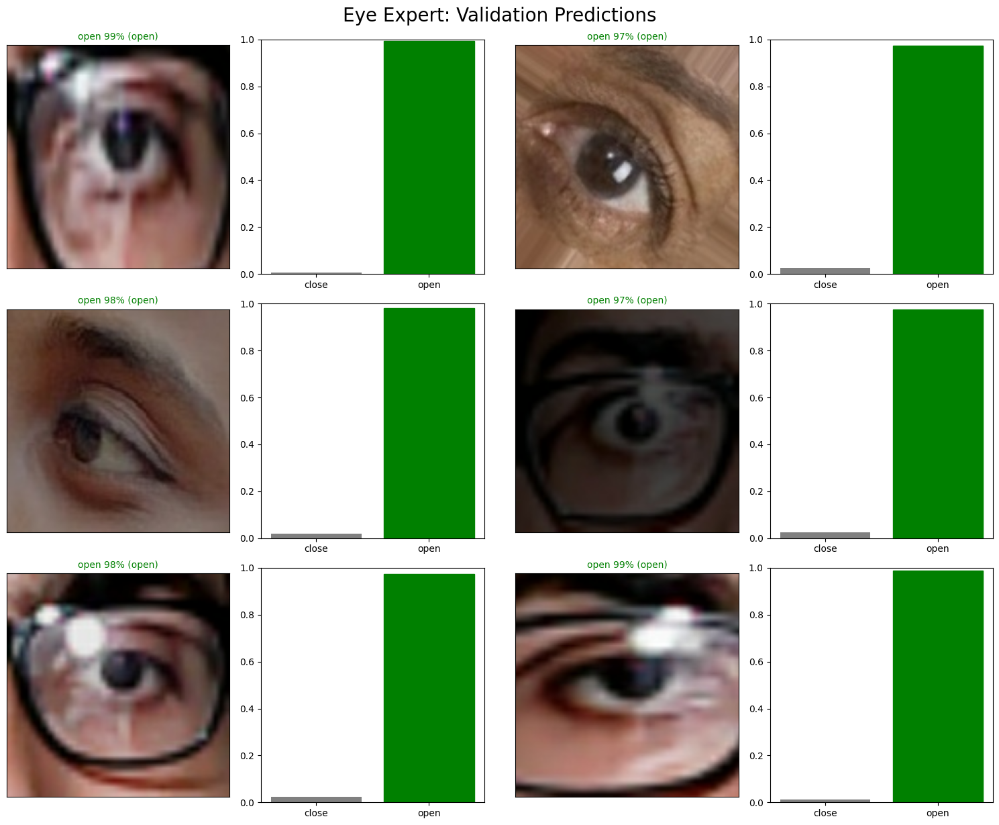

In [89]:
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows * num_cols

# Create a large figure to hold the grid
plt.figure(figsize=(15, 12))

for i in range(num_images):
    # Plot the Image on the left of each pair
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(prediction_probabilities=eye_predictions,
              labels=val_eye_labels,
              images=val_eye_images,
              labels_list=unique_labels1,
              n=i + i_multiplier)

    # Plot the Confidence Bar Chart on the right of each pair
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    # We use a modified version of plot_pred_conf that doesn't create its own figure
    positive_prob = eye_predictions[i + i_multiplier][0]
    plot_values = [1 - positive_prob, positive_prob]
    bars = plt.bar(unique_labels1, plot_values, color="grey")
    plt.ylim(0, 1)
    
    # Highlight the true label bar in green
    true_label = val_eye_labels[i + i_multiplier]
    for idx, lbl in enumerate(unique_labels1):
        if lbl == true_label:
            bars[idx].set_color("green")

plt.tight_layout()
plt.suptitle("Eye Expert: Validation Predictions", fontsize=20, y=1.02)
plt.show()

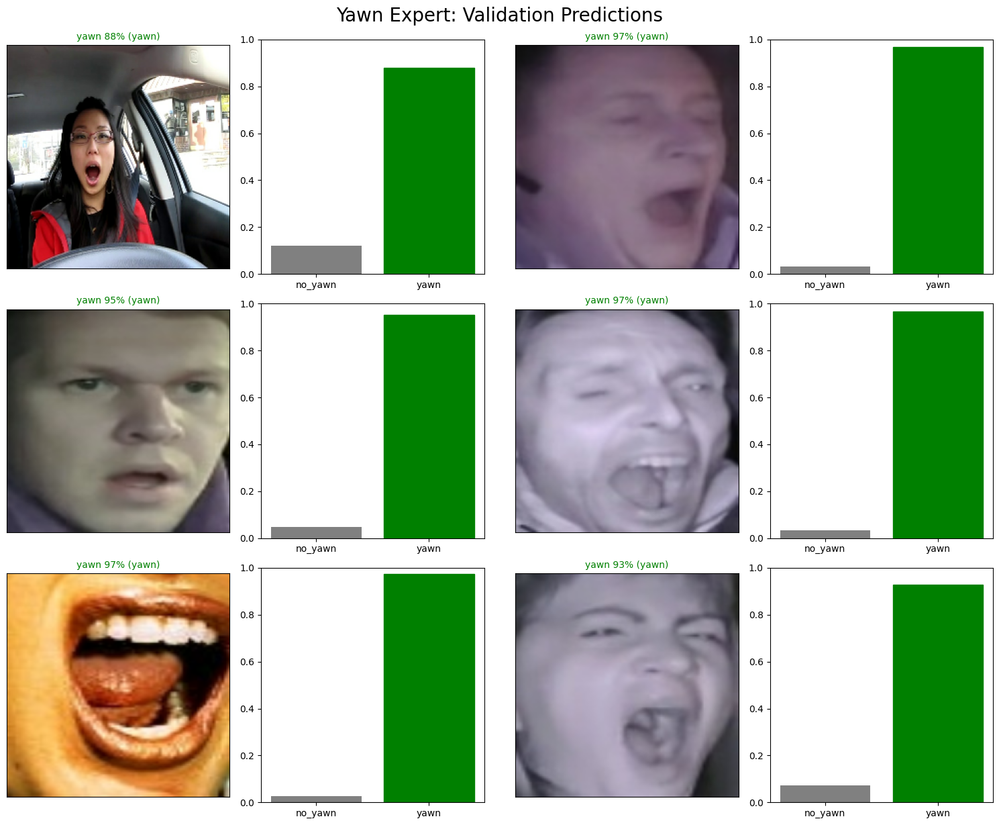

In [90]:
# Just swap the data sources for the Yawn Expert
plt.figure(figsize=(15, 12))

for i in range(num_images):
    plt.subplot(num_rows, 2 * num_cols, 2 * i + 1)
    plot_pred(prediction_probabilities=yawn_predictions,
              labels=val_yawn_labels,
              images=val_yawn_images,
              labels_list=unique_label2,
              n=i + i_multiplier)

    plt.subplot(num_rows, 2 * num_cols, 2 * i + 2)
    pos_prob = yawn_predictions[i + i_multiplier][0]
    bars = plt.bar(unique_label2, [1 - pos_prob, pos_prob], color="grey")
    plt.ylim(0, 1)
    
    t_label = val_yawn_labels[i + i_multiplier]
    for idx, lbl in enumerate(unique_label2):
        if lbl == t_label:
            bars[idx].set_color("green")

plt.tight_layout()
plt.suptitle("Yawn Expert: Validation Predictions", fontsize=20, y=1.02)
plt.show()

## Saving and reloading a trained model

In [91]:
import os

current_directory = os.getcwd()
print("Current directory:", current_directory)

Current directory: /kaggle/working


In [92]:
import os
import datetime
import tensorflow as tf

def save_model_h5(model, suffix=None):
    """ 
    Saves a given model in a 'models' directory with a timestamp and suffix. 
    """
    # Create the directory if it doesn't exist
    base_path = "models"
    if not os.path.exists(base_path):
        os.makedirs(base_path)
    
    # Generate timestamped filename
    timestamp = datetime.datetime.now().strftime("%Y%m%d-%H%M")
    filename = f"{timestamp}-{suffix}.h5"
    model_path = os.path.join(base_path, filename)
    
    print(f"Saving Keras model to: {model_path}...")
    model.save(model_path)
    return model_path

In [93]:
from tensorflow.python.compiler.tensorrt import trt_convert as trt

def save_model_tensorrt(model, suffix):
    """
    Converts and saves a Keras model into a TensorRT optimized SavedModel.
    """
    # 1. Save as a standard SavedModel first (Required for TRT conversion)
    temp_saved_model_dir = f"models/temp_{suffix}"
    model.save(temp_saved_model_dir)
    
    # 2. Set up the TensorRT converter
    # Using DEFAULT_TRT_PRECISION_MODE (FP32) for the 1650
    params = trt.TrtConversionParams(precision_mode='FP32')
    converter = trt.TrtGraphConverterV2(input_saved_model_dir=temp_saved_model_dir,
                                       conversion_params=params)
    
    # 3. Convert and Build
    print(f"Optimizing {suffix} for TensorRT...")
    converter.convert()
    
    # 4. Save the optimized model
    output_dir = f"models/tensorrt_{suffix}_{datetime.datetime.now().strftime('%Y%m%d')}"
    converter.save(output_dir)
    print(f"TensorRT model saved to: {output_dir}")
    
    return output_dir

In [94]:
def load_trained_model(model_path, is_trt=False):
    print(f"Loading saved model from: {model_path}...")
    
    if is_trt:
        model = tf.saved_model.load(model_path)
    else:
        model = tf.keras.models.load_model(
            model_path,
            custom_objects={"KerasLayer": hub.KerasLayer},
            compile=True  # <--- Change this to True
        )
    
    print("Model loaded successfully.")
    return model

In [95]:
# --- Save Eye Expert ---
# Save standard H5
eye_h5_path = save_model_h5(eye_model, suffix="eye_expert")

# Save TensorRT version (This may take a minute as it optimizes kernels)
#eye_trt_path = save_model_tensorrt(eye_model, suffix="eye_expert")

# --- Save Yawn Expert ---
# Save standard H5
yawn_h5_path = save_model_h5(yawn_model, suffix="yawn_expert")

# Save TensorRT version
#yawn_trt_path = save_model_tensorrt(yawn_model, suffix="yawn_expert")

Saving Keras model to: models/20260429-1911-eye_expert.h5...
Saving Keras model to: models/20260429-1911-yawn_expert.h5...


In [97]:
# --- Option A: Loading Standard H5 Models ---
eye_model = load_trained_model("/kaggle/working/models/20260429-1911-eye_expert.h5")
yawn_model = load_trained_model("/kaggle/working/models/20260429-1911-yawn_expert.h5")

# --- Option B: Loading TensorRT Optimized Models ---
# Use this if you are running on your GTX 1650 for maximum FPS
# eye_model = load_trained_model("models/tensorrt_eye_expert_20260418")
# yawn_model = load_trained_model("models/tensorrt_yawn_expert_20260418")

Loading saved model from: /kaggle/working/models/20260429-1911-eye_expert.h5...
Model loaded successfully.
Loading saved model from: /kaggle/working/models/20260429-1911-yawn_expert.h5...
Model loaded successfully.


In [98]:
# --- 1. Evaluate the Eye Expert ---
print("Evaluating Eye Expert Model...")
eye_results = eye_model.evaluate(val_eye_data)
print(f"Eye Model - Loss: {eye_results[0]:.4f}, Accuracy: {eye_results[1]*100:.2f}%")

# --- 2. Evaluate the Yawn Expert ---
print("\nEvaluating Yawn Expert Model...")
yawn_results = yawn_model.evaluate(val_yawn_data)
print(f"Yawn Model - Loss: {yawn_results[0]:.4f}, Accuracy: {yawn_results[1]*100:.2f}%")

Evaluating Eye Expert Model...
2/2 [==============================] - 1s 86ms/step - loss: 2.5162 - accuracy: 1.0000
Eye Model - Loss: 2.5162, Accuracy: 100.00%

Evaluating Yawn Expert Model...
2/2 [==============================] - 1s 94ms/step - loss: 2.5264 - accuracy: 1.0000
Yawn Model - Loss: 2.5264, Accuracy: 100.00%


## Training on full data

In [99]:
# --- 1. Fix the Labels First ---
# As we discussed, binary models need single integers (0 or 1), not boolean arrays.
y_eye_fixed = simplify_labels(y_eye)
y_val_eye_fixed = simplify_labels(y_val_eye)

y_yawn_fixed = simplify_labels(y_yawn)
y_val_yawn_fixed = simplify_labels(y_val_yawn)

# --- 2. Create Full Data Batches for Eye Expert ---
print(f"Creating full batches for Eye Expert ({len(X_eye)} images)...")
full_eye_data = create_data_batches(X_eye, y_eye_fixed)
val_eye_data = create_data_batches(x_val_eye, y_val_eye_fixed, valid_data=True)

# --- 3. Create Full Data Batches for Yawn Expert ---
print(f"Creating full batches for Yawn Expert ({len(X_yawn)} images)...")
full_yawn_data = create_data_batches(X_yawn, y_yawn_fixed)
val_yawn_data = create_data_batches(x_val_yawn, y_val_yawn_fixed, valid_data=True)

# --- 4. Verification Check ---
print(f"\nEye Full Data Spec: {full_eye_data.element_spec[1]}")
print(f"Yawn Full Data Spec: {full_yawn_data.element_spec[1]}")

Creating full batches for Eye Expert (99312 images)...
Creating training data batches......
Creating validation data batches.....
Creating full batches for Yawn Expert (14758 images)...
Creating training data batches......
Creating validation data batches.....

Eye Full Data Spec: TensorSpec(shape=(None,), dtype=tf.int64, name=None)
Yawn Full Data Spec: TensorSpec(shape=(None,), dtype=tf.int64, name=None)


In [100]:
# --- TRACK 1: FULL EYE EXPERT ---
print("--- Training FULL Eye Expert ---")
with strategy.scope():
    full_eye_model = build_expert_model()

# Use the helper function properly to get ALL callbacks
eye_callbacks = create_callbacks("full_eye_model")

full_eye_model.fit(
    x=full_eye_data, # Using the split data we fixed earlier
    validation_data=val_eye_data, # Use the fixed validation data
    epochs=NUM_EPOCHS, # 100 is way too many; 20 is plenty for 99k images
    callbacks=eye_callbacks
)

# --- TRACK 2: FULL YAWN EXPERT ---
print("\n--- Training FULL Yawn Expert ---")
with strategy.scope():
    full_yawn_model = build_expert_model() # Fixed: removed the argument

yawn_callbacks = create_callbacks("full_yawn_model")

full_yawn_model.fit(
    x=full_yawn_data,
    validation_data=val_yawn_data,
    epochs=NUM_EPOCHS,
    callbacks=yawn_callbacks
)

--- Training FULL Eye Expert ---
Epoch 1/100
776/776 [==============================] - 159s 193ms/step - loss: 1.3318 - accuracy: 0.9575 - val_loss: 0.5828 - val_accuracy: 0.9850
Epoch 2/100
776/776 [==============================] - 101s 130ms/step - loss: 0.4193 - accuracy: 0.9861 - val_loss: 0.3020 - val_accuracy: 0.9950
Epoch 3/100
776/776 [==============================] - 101s 129ms/step - loss: 0.2839 - accuracy: 0.9892 - val_loss: 0.2460 - val_accuracy: 0.9950
Epoch 4/100
776/776 [==============================] - 101s 130ms/step - loss: 0.2528 - accuracy: 0.9903 - val_loss: 0.2415 - val_accuracy: 0.9900
Epoch 5/100
776/776 [==============================] - 101s 130ms/step - loss: 0.2432 - accuracy: 0.9908 - val_loss: 0.2275 - val_accuracy: 0.9950
Epoch 6/100
776/776 [==============================] - 100s 129ms/step - loss: 0.2393 - accuracy: 0.9912 - val_loss: 0.2353 - val_accuracy: 0.9950
Epoch 7/100
776/776 [==============================] - 101s 130ms/step - loss: 0.2374

In [101]:
# Save the Full Eye Expert
save_model_h5(full_eye_model, suffix="eye-expert-full-mobilenetv2-Adam")

# Save the Full Yawn Expert
save_model_h5(full_yawn_model, suffix="yawn-expert-full-mobilenetv2-Adam")

Saving Keras model to: models/20260429-1943-eye-expert-full-mobilenetv2-Adam.h5...
Saving Keras model to: models/20260429-1943-yawn-expert-full-mobilenetv2-Adam.h5...


'models/20260429-1943-yawn-expert-full-mobilenetv2-Adam.h5'

In [113]:
# Load the Full Eye Model
# Note: Ensure the path matches exactly where Kaggle or your local system stored the file
loaded_full_eye_model = load_trained_model("/kaggle/working/models/20260429-1943-eye-expert-full-mobilenetv2-Adam.h5")

# Load the Full Yawn Model
loaded_full_yawn_model = load_trained_model("/kaggle/working/models/20260429-1943-yawn-expert-full-mobilenetv2-Adam.h5")

Loading saved model from: /kaggle/working/models/20260429-1943-eye-expert-full-mobilenetv2-Adam.h5...
Model loaded successfully.
Loading saved model from: /kaggle/working/models/20260429-1943-yawn-expert-full-mobilenetv2-Adam.h5...
Model loaded successfully.


## Making predictions on Custom images

In [114]:
import os

# Base path
custom_path = "/kaggle/input/datasets/vatsalyakrish/testing-files/custom_testing"

# --- TRACK 1: EYE TESTING ---
eye_test_dir = os.path.join(custom_path, "model1_testing")
# Get full paths for images only
eye_test_paths = [os.path.join(eye_test_dir, f) for f in os.listdir(eye_test_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# --- TRACK 2: YAWN TESTING ---
yawn_test_dir = os.path.join(custom_path, "model2_testing")
yawn_test_paths = [os.path.join(yawn_test_dir, f) for f in os.listdir(yawn_test_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Turn into batches (ensure your create_data_batches handles labels=None for test_data=True)
eye_custom_data = create_data_batches(eye_test_paths, test_data=True)
yawn_custom_data = create_data_batches(yawn_test_paths, test_data=True)

Creating test data batches....
Creating test data batches....


In [119]:
# Raw predictions stay the same
eye_custom_preds = loaded_full_eye_model.predict(eye_custom_data)
yawn_custom_preds = loaded_full_yawn_model.predict(yawn_custom_data)

eye_custom_results = []

for p in eye_custom_preds:
    prob = float(p[0])

    # If prob = probability of OPEN
    if prob < 0.5:
        label = "Closed"
    else:
        label = "Open"

    eye_custom_results.append(f"{label} ({prob:.2f})")

yawn_custom_results = []
for p in yawn_custom_preds:
    prob = p[0]
    # We use 0.5 as the baseline since we regularized; 
    # but we can visually check if it's hitting your 0.8 target.
    label = unique_label2[1] if prob > 0.8 else unique_label2[0]
    yawn_custom_results.append(f"{label}\n({prob:.2f})")

1/1 [==============================] - 0s 222ms/step


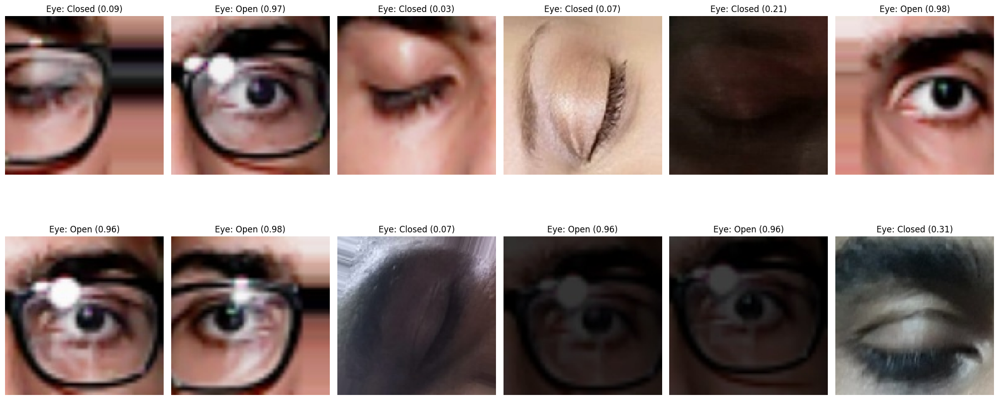

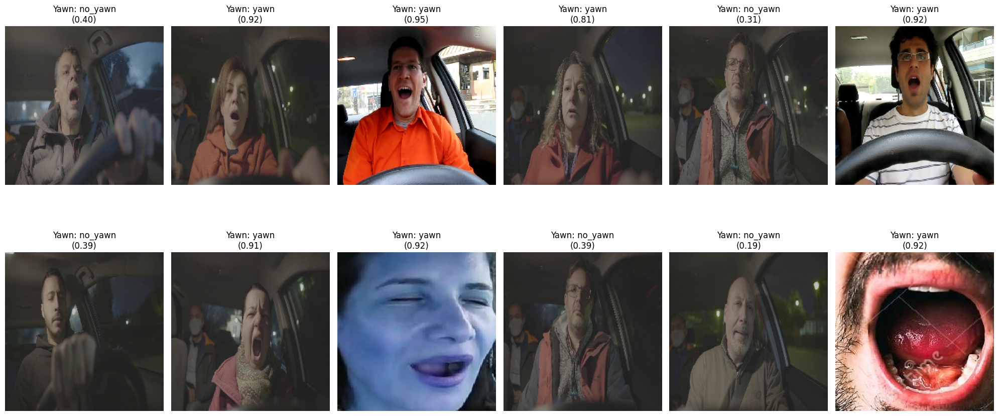

In [120]:
def plot_custom_results(paths, labels, title_prefix):
    plt.figure(figsize=(20, 10))
    for i, path in enumerate(paths[:12]): # Limit to 12 images
        plt.subplot(2, 6, i + 1)
        img = tf.keras.preprocessing.image.load_img(path, target_size=(224, 224))
        plt.imshow(img)
        plt.title(f"{title_prefix}: {labels[i]}")
        plt.axis("off")
    plt.tight_layout()

# Plot Eye Results
plot_custom_results(eye_test_paths, eye_custom_results, "Eye")

# Plot Yawn Results
plot_custom_results(yawn_test_paths, yawn_custom_results, "Yawn")

## DriveSafe-VISION-DMS-v2
### Developed by Vatsalya
### GitHub: https://github.com/Vatsalyakrish02
### License: MIT